This notebook produces the phase plots and moment umaps for P013T in Figure 6 E and F.

# Imports (run these first!)

In [1]:
import scvelo as scv
from IPython.display import clear_output
import matplotlib.backends.backend_pdf
from tqdm import tnrange, tqdm_notebook
import scanpy as sc
import matplotlib.pyplot as pl
import pandas as pd
import numpy as np
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
%matplotlib inline


scv.logging.print_version()
scv.settings.set_figure_params(
    'scvelo', dpi_save=100, dpi=80, transparent=True)
scv.settings.verbosity = 2

Running scvelo 0.1.16.dev32+c00a55e.dirty (python 3.6.6) on 2021-01-27 13:15.


In [2]:
# paths and names, change accordingly
data_path='G:/data/scSLAMseq/revision/'
signatures_path='G:/data/scrnaseq_signature_collection/'
figure_path='G:/data/figures/'
libraries = ['AB', 'CE', 'DF']
donors=['B2-040', 'C2-019', 'OT227', 'OT302', 'P009T', 'P013T']

# P013T phase plots (Fig6 E and F)

In [3]:
adata = scv.read(data_path+'DMSOandEGFR_P013T_ccreg_savemodel.h5')
adata.uns['perturbation_colors'] = ['#858585', '#c31f26']

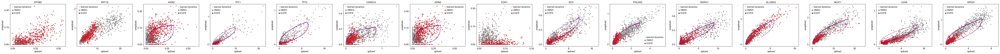

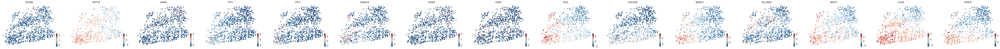

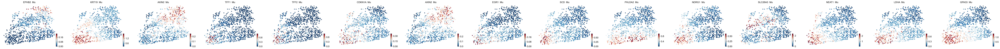

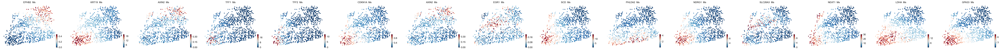

In [4]:
# Fig 6E and F
genes = ['EPHB2', 'KRT19', 'AXIN2', 'TFF1', 'TFF2', 'CDKN1A', 'AXIN2', 'EGR1', 'SCD', 'PHLDA2', 'NDRG1', 'SLC26A3', 'NEAT1', 'LDHA', 'GPA33', 'ALDOA']
scv.pl.scatter(adata, basis=genes, color='perturbation', legend_loc='best')
scv.pl.scatter(adata, basis='umap', color=genes)
scv.pl.scatter(adata, basis='umap', color=genes, layer='Mu')
scv.pl.scatter(adata, basis='umap', color=genes, layer='Ms')

In [36]:
# Fig 6E specifically
genes = ['AXIN2', 'LDHA', 'ALDOA']
donor='P013T'

from scvelo.plotting.utils import default_size
from matplotlib.backends.backend_pdf import PdfPages
adata = scv.read(data_path+'DMSOandEGFR_P013T_ccreg_savemodel.h5')
adata.uns['perturbation_colors'] = ['#858585', '#c31f26']
with PdfPages(figure_path+donor+'_special_umaps_2.pdf') as pdf:
    kwargs = {'size': default_size(adata)*4, 'alpha': 0.4, 'legend_loc': 'right_margin', 'show': False}
    scv.pl.scatter(adata, color=['perturbation'], **kwargs)
    pdf.savefig()  # saves the current figure into a pdf page
    pl.close()
    for gene in genes:
        if gene in adata.var_names:
            scv.pl.scatter(adata, color=gene, 
                           layer=['Ms', 'Mu'],
                           title=[gene+' '+x for x in ['SLAM old Moment', 'SLAM new Moment']],
                           **kwargs)
            pdf.savefig()  # saves the current figure into a pdf page
            pl.close()
            
            scv.pl.scatter(adata, basis=gene, color='perturbation', show= False)
            pdf.savefig()  # saves the current figure into a pdf page
            pl.close()